In [1]:
import os
import zipfile
import matplotlib.pyplot as plt
from PIL import Image
import random

In [28]:
#Öncelikle gerekli kütüphaneleri yükleyelim.

In [29]:
#daha sonra zip dosyalarından verileri çıkartalım.

In [30]:
# Zip dosyalarının yolları ve çıkarılacak klasörler
train_zip_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train.zip"  # Eğitim zip dosyasının yolu
test_zip_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/test1.zip"   # Test zip dosyasının yolu
train_extract_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train"  # Eğitim verilerinin çıkarılacağı klasör
test_extract_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/test"    # Test verilerinin çıkarılacağı klasör

# Eğitim setini çıkarma işlemi
with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
    zip_ref.extractall(train_extract_path)

# Test setini çıkarma işlemi
with zipfile.ZipFile(test_zip_path, 'r') as zip_ref:
    zip_ref.extractall(test_extract_path)

print("Dosyalar başarıyla çıkarıldı.")

Dosyalar başarıyla çıkarıldı.


In [3]:
# Eğitim klasöründen rastgele görselleri yükleyip gösteren fonksiyon
def show_random_images(folder_path, category="cat", num_images=5):
    images = [img for img in os.listdir(folder_path) if img.lower().startswith(category)]
    if not images:
        print(f"{category} kategorisinde uygun görsel bulunamadı.")
        return
    
    plt.figure(figsize=(15, 10))
    selected_images = random.sample(images, min(num_images, len(images)))
    
    for i, image in enumerate(selected_images):
        img_path = os.path.join(folder_path, image)
        try:
            img = Image.open(img_path)
            img = img.resize((128, 128))  # Görseli küçült
            plt.subplot(1, num_images, i + 1)
            plt.imshow(img)
            plt.title(image)
            plt.axis('off')
        except Exception as e:
            print(f"Görsel yüklenemedi: {img_path}. Hata: {e}")
    
    plt.show()

# Kediler ve köpekler için görselleştirme
print("Küçük boyutlu kedi görselleri:")
show_random_images(train_extract_path, category="cat")

print("Küçük boyutlu köpek görselleri:")
show_random_images(train_extract_path, category="dog")

Küçük boyutlu kedi görselleri:
cat kategorisinde uygun görsel bulunamadı.
Küçük boyutlu köpek görselleri:
dog kategorisinde uygun görsel bulunamadı.


In [ ]:
#hata aldık.
#aldığımız hatayı çözmek için dosya isimlerini ve yapısını kontrol edip doğru bir şekilde yüklemek için adımları güncelleyelim.

In [4]:
# Eğitim klasöründeki tüm dosyaları listeleyin
train_files = os.listdir(train_extract_path)
print("Eğitim klasöründeki dosyalar:", train_files[:10])  # İlk 10 dosyayı göster


Eğitim klasöründeki dosyalar: ['train']


In [5]:
# Rastgele görselleri gösteren fonksiyon
def show_random_images(folder_path, num_images=5):
    images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    if not images:
        print("Uygun görsel bulunamadı.")
        return
    
    plt.figure(figsize=(15, 10))
    selected_images = random.sample(images, min(num_images, len(images)))
    
    for i, image in enumerate(selected_images):
        img_path = os.path.join(folder_path, image)
        try:
            img = Image.open(img_path)
            img = img.resize((128, 128))  # Görseli küçült
            plt.subplot(1, num_images, i + 1)
            plt.imshow(img)
            plt.title(image)
            plt.axis('off')
        except Exception as e:
            print(f"Görsel yüklenemedi: {img_path}. Hata: {e}")
    
    plt.show()

# Eğitim klasöründeki görselleri görselleştirme
print("Eğitim klasöründeki görseller:")
show_random_images(train_extract_path)


Eğitim klasöründeki görseller:
Uygun görsel bulunamadı.


In [ ]:
#tekrar hata aldık
#Öncelikle, klasörün içeriğini tam olarak görmek için ayrıntılı bir listeleme yapalım

In [6]:
# Klasör yapısını ve içeriğini detaylı listelemek için
for root, dirs, files in os.walk(train_extract_path):
    print(f"Klasör: {root}")
    print(f"Alt Klasörler: {dirs}")
    print(f"Dosyalar: {files[:10]}")  # İlk 10 dosyayı göster
    print("-" * 50)


Klasör: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train
Alt Klasörler: ['train']
Dosyalar: []
--------------------------------------------------
Klasör: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train\train
Alt Klasörler: []
Dosyalar: ['cat.0.jpg', 'cat.1.jpg', 'cat.10.jpg', 'cat.100.jpg', 'cat.1000.jpg', 'cat.10000.jpg', 'cat.10001.jpg', 'cat.10002.jpg', 'cat.10003.jpg', 'cat.10004.jpg']
--------------------------------------------------


In [ ]:
#şimdi klasör yapınıza göre, doğru klasör yolunu belirleyip görselleri o klasörden yükleyerek görselleştirme yapacağız.

Eğitim klasöründeki görseller:


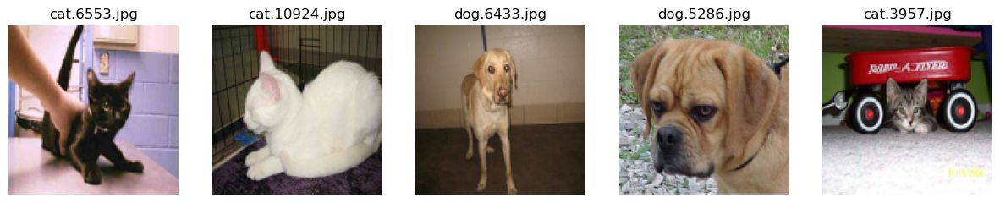

In [7]:
# Görsellerin bulunduğu doğru klasör yolu
correct_train_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train"

# Rastgele görselleri gösteren fonksiyon
def show_random_images(folder_path, num_images=5):
    # Görselleri listeleme
    images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    if not images:
        print("Uygun görsel bulunamadı.")
        return
    
    plt.figure(figsize=(15, 10))
    selected_images = random.sample(images, min(num_images, len(images)))
    
    for i, image in enumerate(selected_images):
        img_path = os.path.join(folder_path, image)
        try:
            img = Image.open(img_path)
            img = img.resize((128, 128))  # Görseli küçült
            plt.subplot(1, num_images, i + 1)
            plt.imshow(img)
            plt.title(image)
            plt.axis('off')
        except Exception as e:
            print(f"Görsel yüklenemedi: {img_path}. Hata: {e}")
    
    plt.show()

# Eğitim klasöründeki görselleri görselleştirme
print("Eğitim klasöründeki görseller:")
show_random_images(correct_train_path)


In [ ]:
#yukarıda veriyi yükledik.
#şimdi Görüntü Boyutu, Renk Kanalları ve Dağılımlarının Analizi yapacağız.
#kütüphaneleri yüklemiştik ancak atlamamak adına tekrar yazıyoruz. ve görsel analiz matplotlib ile devam ediyoruz.

In [8]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import numpy as np

In [9]:
# Görsellerin bulunduğu doğru klasör yolu
correct_train_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train"

# Renk kanallarını ve boyutlarını analiz eden fonksiyon
def analyze_image_channels(folder_path, num_images=5):
    # Görselleri listeleme
    images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    selected_images = random.sample(images, min(num_images, len(images)))

    for image_name in selected_images:
        img_path = os.path.join(folder_path, image_name)
        img = cv2.imread(img_path)
        
        # Görüntü boyutlarını yazdırma
        print(f"Görsel Adı: {image_name}, Boyut: {img.shape}")

        # Görüntüyü RGB formatına dönüştürme
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Renk kanallarını ayırma
        red_channel = img_rgb[:, :, 0]
        green_channel = img_rgb[:, :, 1]
        blue_channel = img_rgb[:, :, 2]

        # Renk kanallarını görselleştirme
        plt.figure(figsize=(18, 6))
        
        # Orijinal Görsel
        plt.subplot(1, 4, 1)
        plt.imshow(img_rgb)
        plt.title("Orijinal Görsel")
        plt.axis('off')
        
        # Kırmızı Kanal
        plt.subplot(1, 4, 2)
        plt.imshow(red_channel, cmap='Reds')
        plt.title("Kırmızı Kanal")
        plt.axis('off')
        
        # Yeşil Kanal
        plt.subplot(1, 4, 3)
        plt.imshow(green_channel, cmap='Greens')
        plt.title("Yeşil Kanal")
        plt.axis('off')
        
        # Mavi Kanal
        plt.subplot(1, 4, 4)
        plt.imshow(blue_channel, cmap='Blues')
        plt.title("Mavi Kanal")
        plt.axis('off')
        
        plt.show()

# Görsellerin analiz edilmesi
analyze_image_channels(correct_train_path)

AttributeError: 'NoneType' object has no attribute 'shape'

In [ ]:
#aldığımız hata cv2.imread() fonksiyonunun belirli bir görseli yükleyemediğini söylüyor.
#biz görsel yüklenemediğinde hatayı atlayarak sadece yüklenebilen görseller üzerinde işlem yapacak bir kod yazıyoruz.

In [10]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import numpy as np
import random

# Görsellerin bulunduğu doğru klasör yolu
correct_train_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train"

# Renk kanallarını ve boyutlarını analiz eden fonksiyon
def analyze_image_channels(folder_path, num_images=5):
    # Görselleri listeleme
    images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    selected_images = random.sample(images, min(num_images, len(images)))

    for image_name in selected_images:
        img_path = os.path.join(folder_path, image_name)
        img = cv2.imread(img_path)
        
        # Görselin yüklendiğini kontrol etme
        if img is None:
            print(f"Görsel yüklenemedi: {img_path}. Dosya bozuk olabilir veya desteklenmeyen bir format olabilir.")
            continue
        
        # Görüntü boyutlarını yazdırma
        print(f"Görsel Adı: {image_name}, Boyut: {img.shape}")

        # Görüntüyü RGB formatına dönüştürme
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Renk kanallarını ayırma
        red_channel = img_rgb[:, :, 0]
        green_channel = img_rgb[:, :, 1]
        blue_channel = img_rgb[:, :, 2]

        # Renk kanallarını görselleştirme
        plt.figure(figsize=(18, 6))
        
        # Orijinal Görsel
        plt.subplot(1, 4, 1)
        plt.imshow(img_rgb)
        plt.title("Orijinal Görsel")
        plt.axis('off')
        
        # Kırmızı Kanal
        plt.subplot(1, 4, 2)
        plt.imshow(red_channel, cmap='Reds')
        plt.title("Kırmızı Kanal")
        plt.axis('off')
        
        # Yeşil Kanal
        plt.subplot(1, 4, 3)
        plt.imshow(green_channel, cmap='Greens')
        plt.title("Yeşil Kanal")
        plt.axis('off')
        
        # Mavi Kanal
        plt.subplot(1, 4, 4)
        plt.imshow(blue_channel, cmap='Blues')
        plt.title("Mavi Kanal")
        plt.axis('off')
        
        plt.show()

# Görsellerin analiz edilmesi
analyze_image_channels(correct_train_path)


Görsel yüklenemedi: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train\dog.3091.jpg. Dosya bozuk olabilir veya desteklenmeyen bir format olabilir.
Görsel yüklenemedi: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train\dog.8237.jpg. Dosya bozuk olabilir veya desteklenmeyen bir format olabilir.
Görsel yüklenemedi: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train\dog.9407.jpg. Dosya bozuk olabilir veya desteklenmeyen bir format olabilir.
Görsel yüklenemedi: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train\dog.10328.jpg. Dosya bozuk olabilir veya desteklenmeyen bir format olabilir.
Görsel yüklenemedi: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train\dog.8683.jpg. Dosya bozuk olabilir veya desteklenmeyen bir format olabilir.


In [ ]:
#yine hatalar aldık.
#şimdi görselleri alternatif yöntemlerle yüklemeyi deneyeceğiz.
#Python’un Pillow (PIL) kütüphanesini kullanarak görselleri yüklemeyi ve analiz etmeyi deneyeceğiz.

In [ ]:
#Aşağıdaki kod, görselleri PIL ile yükleyerek işlem yapacaktır. 
#PIL kütüphanesi genellikle OpenCV’nin okuyamadığı dosyaları daha başarılı bir şekilde okuyabilir.

Görsel Adı: cat.10481.jpg, Boyut: (415, 500, 3)


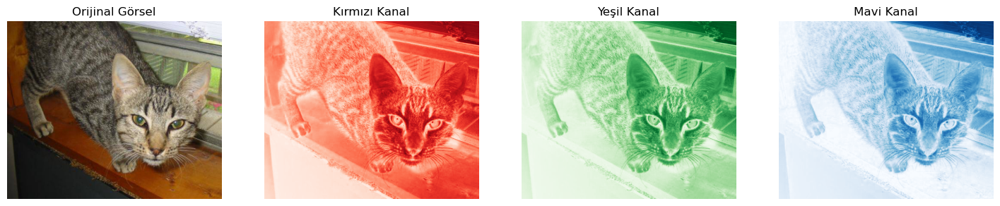

Görsel Adı: dog.8199.jpg, Boyut: (344, 475, 3)


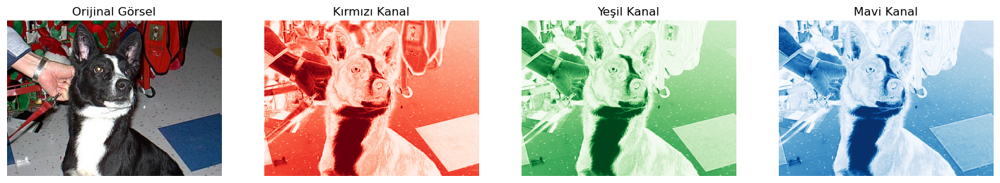

Görsel Adı: cat.5236.jpg, Boyut: (332, 500, 3)


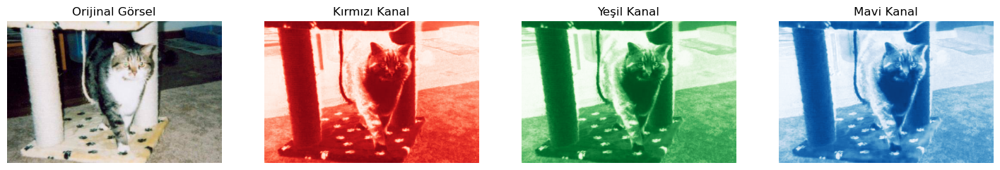

Görsel Adı: cat.4675.jpg, Boyut: (499, 349, 3)


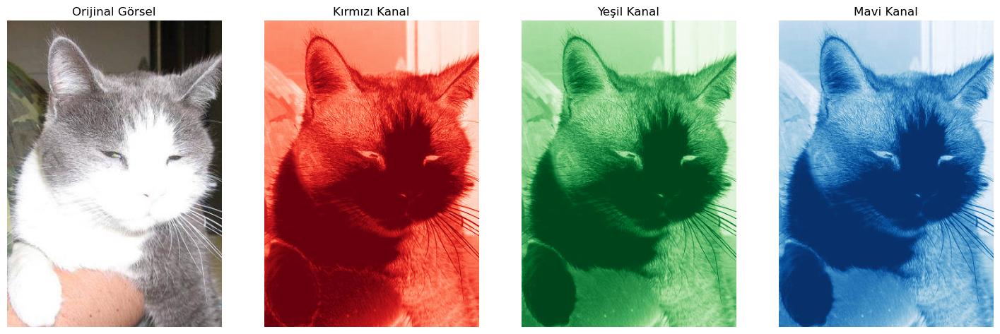

Görsel Adı: cat.7388.jpg, Boyut: (499, 474, 3)


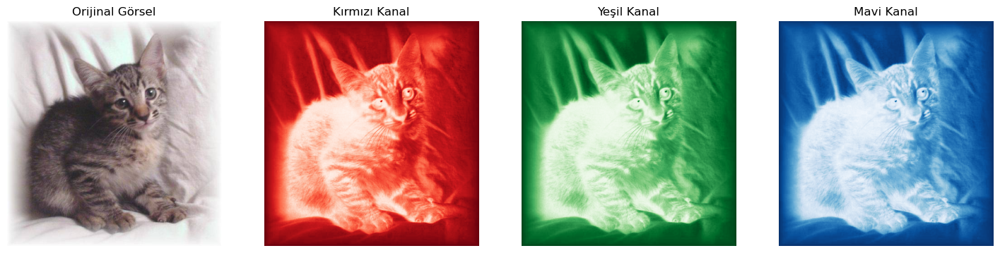

In [11]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import random

# Görsellerin bulunduğu doğru klasör yolu
correct_train_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train"

# Renk kanallarını ve boyutlarını analiz eden fonksiyon
def analyze_image_channels_with_pil(folder_path, num_images=5):
    # Görselleri listeleme
    images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    selected_images = random.sample(images, min(num_images, len(images)))

    for image_name in selected_images:
        img_path = os.path.join(folder_path, image_name)
        try:
            # Görseli PIL ile yükleme
            img = Image.open(img_path)
            img_array = np.array(img)

            # Görüntü boyutlarını yazdırma
            print(f"Görsel Adı: {image_name}, Boyut: {img_array.shape}")

            # Renk kanallarını ayırma
            red_channel = img_array[:, :, 0]
            green_channel = img_array[:, :, 1]
            blue_channel = img_array[:, :, 2]

            # Renk kanallarını görselleştirme
            plt.figure(figsize=(18, 6))

            # Orijinal Görsel
            plt.subplot(1, 4, 1)
            plt.imshow(img)
            plt.title("Orijinal Görsel")
            plt.axis('off')

            # Kırmızı Kanal
            plt.subplot(1, 4, 2)
            plt.imshow(red_channel, cmap='Reds')
            plt.title("Kırmızı Kanal")
            plt.axis('off')

            # Yeşil Kanal
            plt.subplot(1, 4, 3)
            plt.imshow(green_channel, cmap='Greens')
            plt.title("Yeşil Kanal")
            plt.axis('off')

            # Mavi Kanal
            plt.subplot(1, 4, 4)
            plt.imshow(blue_channel, cmap='Blues')
            plt.title("Mavi Kanal")
            plt.axis('off')

            plt.show()

        except Exception as e:
            print(f"Görsel yüklenemedi: {img_path}. Hata: {e}")

# Görsellerin analiz edilmesi
analyze_image_channels_with_pil(correct_train_path)


In [ ]:
#Kedinin tüyleri ve köpeğin beyaz bölgeleri kırmızı tonlarında daha parlak görünüyor.
#Kedinin ve köpeğin bulunduğu ortamın yeşil kısımları daha net gözükmekte
#Kedinin bulunduğu yerin mavi bölümleri ve köpeğin fotoğrafındaki zemin daha belirgin hale geliyor.

In [ ]:
#Histogram analizi yapıyoruz. Görsellerin Renk Kanallarının Dağılımı

Görsel Adı: dog.148.jpg, Boyut: (331, 500, 3)


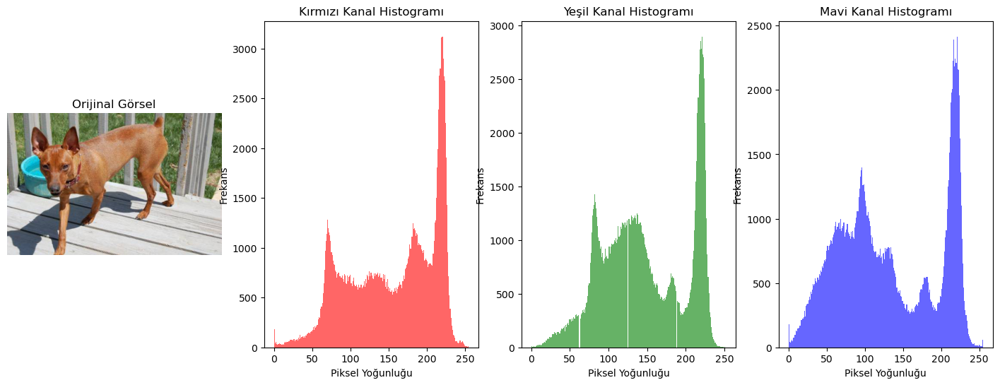

Görsel Adı: dog.12274.jpg, Boyut: (500, 307, 3)


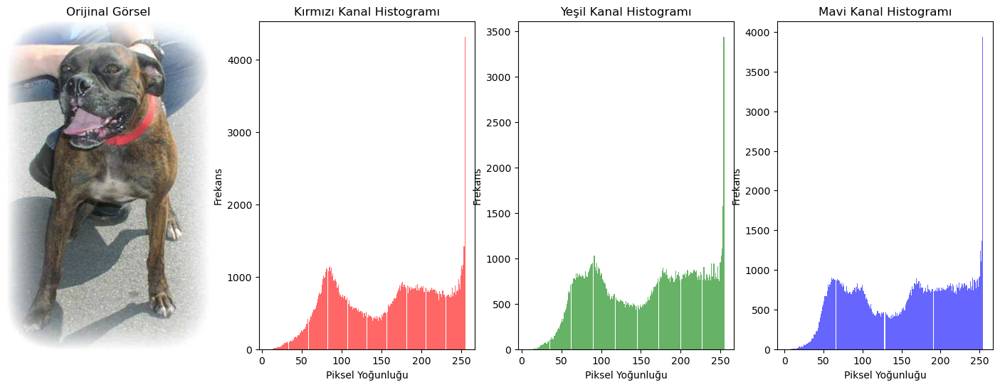

Görsel Adı: dog.11018.jpg, Boyut: (376, 500, 3)


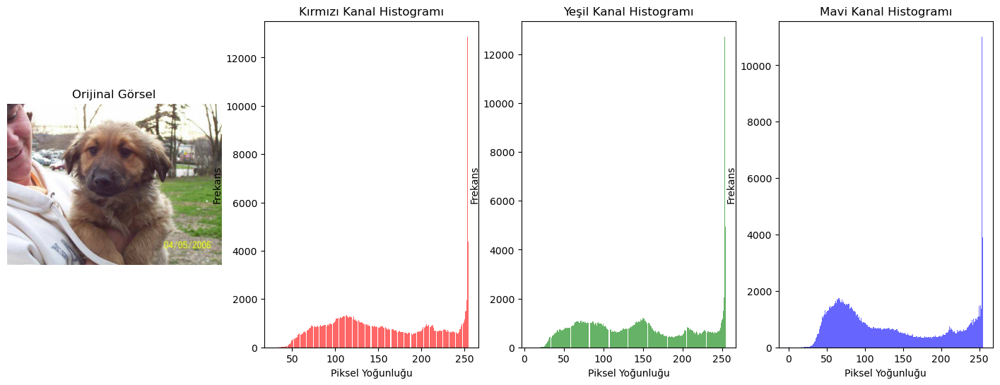

Görsel Adı: cat.6252.jpg, Boyut: (481, 375, 3)


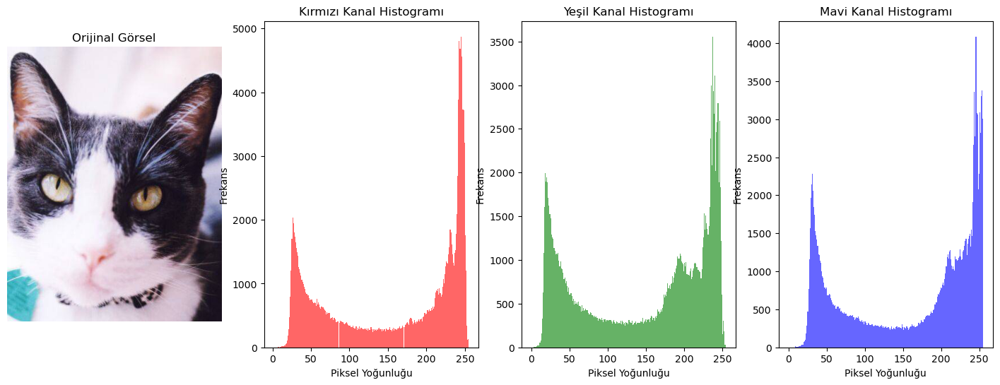

Görsel Adı: dog.4241.jpg, Boyut: (500, 389, 3)


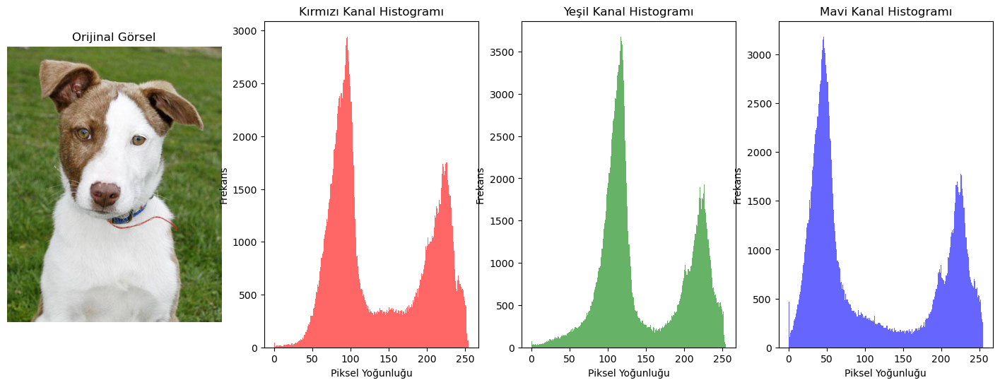

In [12]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import random

# Görsellerin bulunduğu doğru klasör yolu
correct_train_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train"

# Histogram analiz fonksiyonu
def analyze_image_histograms(folder_path, num_images=5):
    # Görselleri listeleme
    images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    selected_images = random.sample(images, min(num_images, len(images)))

    for image_name in selected_images:
        img_path = os.path.join(folder_path, image_name)
        try:
            # Görseli PIL ile yükleme ve numpy dizisine çevirme
            img = Image.open(img_path)
            img_array = np.array(img)

            # Görüntü boyutlarını yazdırma
            print(f"Görsel Adı: {image_name}, Boyut: {img_array.shape}")

            # Renk kanallarını ayırma
            red_channel = img_array[:, :, 0]
            green_channel = img_array[:, :, 1]
            blue_channel = img_array[:, :, 2]

            # Histogramları görselleştirme
            plt.figure(figsize=(18, 6))

            # Orijinal Görsel
            plt.subplot(1, 4, 1)
            plt.imshow(img)
            plt.title("Orijinal Görsel")
            plt.axis('off')

            # Kırmızı Kanal Histogramı
            plt.subplot(1, 4, 2)
            plt.hist(red_channel.ravel(), bins=256, color='red', alpha=0.6)
            plt.title("Kırmızı Kanal Histogramı")
            plt.xlabel('Piksel Yoğunluğu')
            plt.ylabel('Frekans')

            # Yeşil Kanal Histogramı
            plt.subplot(1, 4, 3)
            plt.hist(green_channel.ravel(), bins=256, color='green', alpha=0.6)
            plt.title("Yeşil Kanal Histogramı")
            plt.xlabel('Piksel Yoğunluğu')
            plt.ylabel('Frekans')

            # Mavi Kanal Histogramı
            plt.subplot(1, 4, 4)
            plt.hist(blue_channel.ravel(), bins=256, color='blue', alpha=0.6)
            plt.title("Mavi Kanal Histogramı")
            plt.xlabel('Piksel Yoğunluğu')
            plt.ylabel('Frekans')

            plt.show()

        except Exception as e:
            print(f"Görsel yüklenemedi: {img_path}. Hata: {e}")

# Görsellerin histogram analizini yapma
analyze_image_histograms(correct_train_path)


In [ ]:
#Kırmızı kanal histogramında iki belirgin tepe noktası bulunuyor. 
#İlk tepe, düşük yoğunluklu kırmızı tonlarını (muhtemelen gölgeli bölgeler ve arka plan) gösterirken, 
#ikinci tepe yüksek kırmızı yoğunluklarını temsil ediyor. 
#Bu, köpeğin kahverengi tüylerinin ve zeminin kırmızı tonları içerdiğini 
#ve bunların histogramda belirgin şekilde öne çıktığını gösteriyor.

In [ ]:
#Yeşil kanalda, orta seviyelerde bir tepe noktası ve sonrasında yüksek yoğunluklu bir artış gözleniyor. 
#Bu, arka plandaki bitki örtüsü ve ahşap zemin ile ilişkili olabilir.

In [ ]:
#Mavi kanal histogramında da belirgin tepe noktaları var, 
#fakat kırmızı ve yeşil kanallara göre daha geniş bir dağılım gözleniyor. 
#Bu, zeminin maviye yakın tonları ve arka planda gökyüzü veya su benzeri mavi tonların varlığını gösterir.

In [ ]:
#şimdi görüntüler üzerinde ön işleme adımlarını yapıyoruz.
#altta görüntü ön işleme kodu yer alıyor.

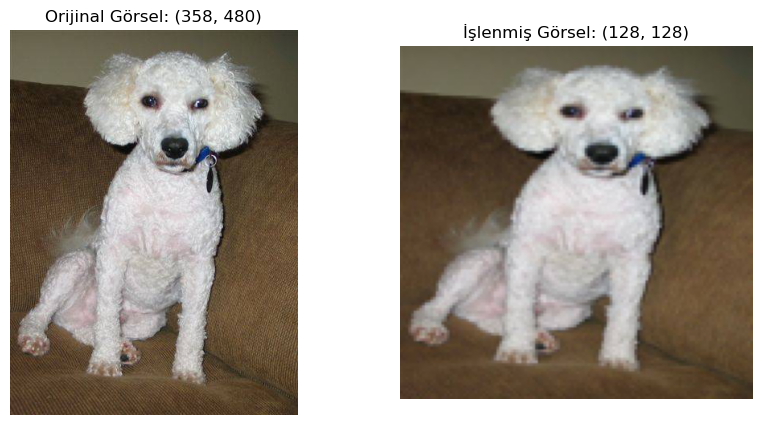

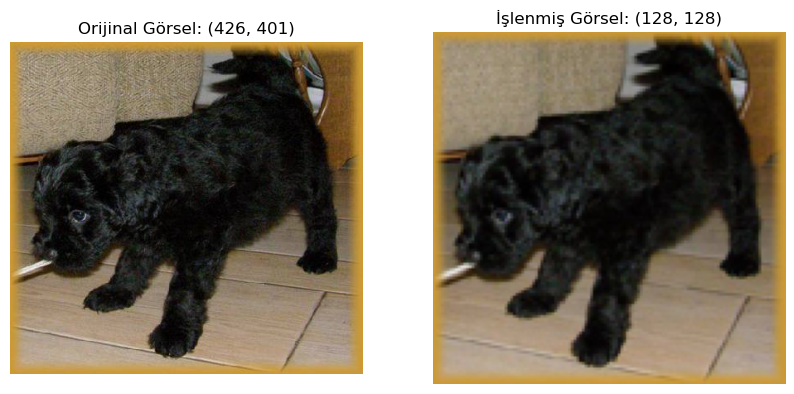

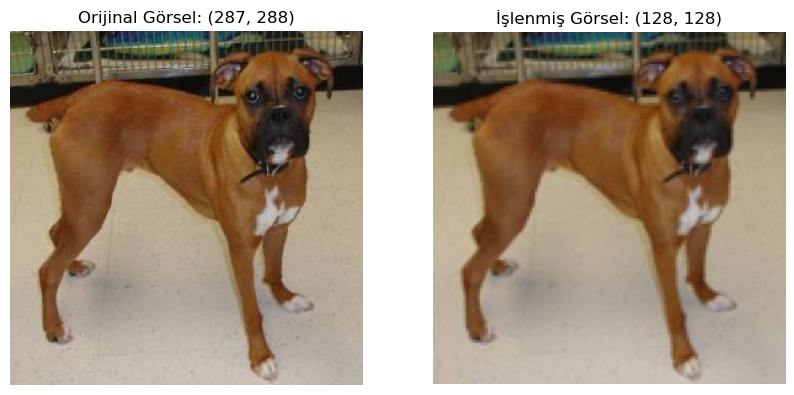

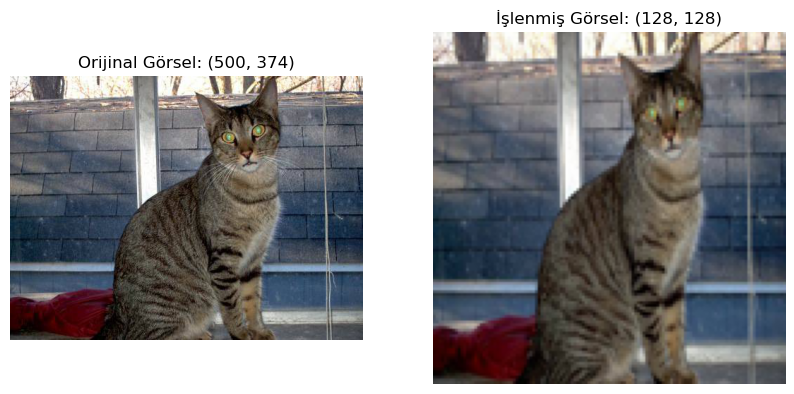

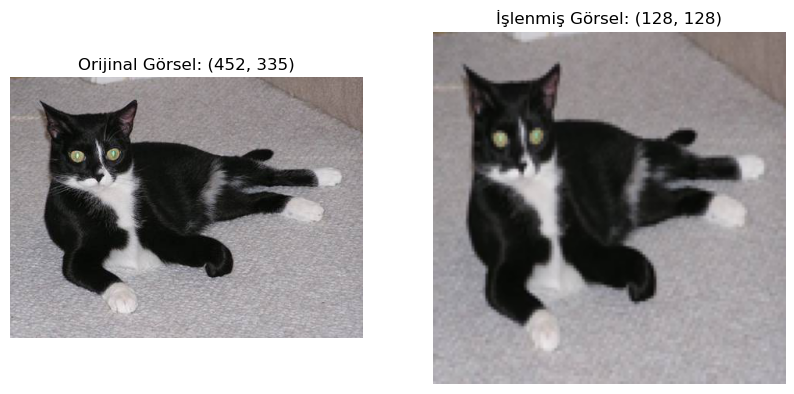

In [13]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Görsellerin bulunduğu doğru klasör yolu
correct_train_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train"

# Yeniden boyutlandırma ve normalleştirme fonksiyonu
def preprocess_images(folder_path, target_size=(128, 128), num_images=5):
    images = [img for img in os.listdir(folder_path) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
    selected_images = random.sample(images, min(num_images, len(images)))

    preprocessed_images = []
    
    for image_name in selected_images:
        img_path = os.path.join(folder_path, image_name)
        try:
            # Görseli yükleme ve yeniden boyutlandırma
            img = Image.open(img_path)
            img_resized = img.resize(target_size)

            # Görseli numpy array formatına çevirme ve normalleştirme
            img_array = np.array(img_resized) / 255.0  # Piksel değerlerini 0-1 aralığına indirgeme
            
            # Ön işlenmiş görseli listeye ekleme
            preprocessed_images.append(img_array)

            # Görseli ve ön işlenmiş halini görselleştirme
            plt.figure(figsize=(10, 5))
            
            # Orijinal Görsel
            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.title(f"Orijinal Görsel: {img.size}")
            plt.axis('off')
            
            # İşlenmiş Görsel
            plt.subplot(1, 2, 2)
            plt.imshow(img_resized)
            plt.title(f"İşlenmiş Görsel: {target_size}")
            plt.axis('off')
            
            plt.show()
        
        except Exception as e:
            print(f"Görsel işlenemedi: {img_path}. Hata: {e}")

    return preprocessed_images

# Görsellerin ön işlenmesi (boyutlandırma ve normalleştirme)
processed_images = preprocess_images(correct_train_path, target_size=(128, 128))

In [ ]:
#Yeniden boyutlandırma sırasında görselin piksel sayısı önemli ölçüde azalır, 
#bu da detay kaybına yol açabilir. Görseldeki ince detaylar, küçük boyutta birleştirilir ve görsel kalitesi bir miktar düşer.

In [ ]:
#Görsellerin bu şekilde küçültülmesi, model eğitimi için oldukça yaygındır. 
#Modelin işlem yükünü azaltmak ve bellek kullanımını optimize etmek için bu tür boyutlandırmalar yapılır.

### Bu aşamada, derin öğrenme modelleri arasından Evrişimli Sinir Ağları (Convolutional Neural Networks - CNN) kullanarak bir model eğiteceğiz. Modeli eğitirken, overfitting'i önlemek için gerekli düzenlemeleri yapacağız ve eğitim sürecini grafiklerle izleyip yorumlayacağız.

In [14]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

In [15]:
#Eğitim ve doğrulama setlerini hazırlamak için ImageDataGenerator sınıfını kullanarak verileri ön işlemeden geçireceğiz
# Eğitim ve doğrulama veri setleri için ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # %20 doğrulama için ayrılacak

# Eğitim verileri
train_generator = train_datagen.flow_from_directory(
    directory="C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train",
    target_size=(128, 128),  # Modelin giriş boyutlarına uygun olmalı
    batch_size=32,
    class_mode='binary',
    subset='training')  # Eğitim için %80 veri

# Doğrulama verileri
validation_generator = train_datagen.flow_from_directory(
    directory="C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train",
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='validation')  # Doğrulama için %20 veri

Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


ImageDataGenerator, her bir sınıfın (örneğin, cat ve dog) ayrı klasörlerde olmasını bekler. o yüzden hata aldık.

In [16]:
import os
import shutil

# Eğitim klasör yolu
base_path = "C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train"

# Yeni klasör yapısı için hedef yollar
cat_path = os.path.join(base_path, "cat")
dog_path = os.path.join(base_path, "dog")

# Hedef klasörleri oluştur
os.makedirs(cat_path, exist_ok=True)
os.makedirs(dog_path, exist_ok=True)

# Görselleri uygun klasörlere taşı
for file_name in os.listdir(base_path):
    if file_name.startswith("cat"):
        shutil.move(os.path.join(base_path, file_name), cat_path)
    elif file_name.startswith("dog"):
        shutil.move(os.path.join(base_path, file_name), dog_path)

print("Görseller uygun klasörlere taşındı.")

Görseller uygun klasörlere taşındı.


In [17]:
# ImageDataGenerator ile verileri yükleme
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    directory=base_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    directory=base_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)

Found 20000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.


başarıyla yükleme yaptığımızı görüyoruz.

modeli oluşturmak, eğitmek ve grafiklerle overfitting olup olmadığını kontrol etmek için CNN modelini oluşturup eğitiyoruz.

In [18]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# CNN modelini oluşturma
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # Overfitting'i önlemek için dropout eklenmiştir
    Dense(1, activation='sigmoid')  # İki sınıf için sigmoid aktivasyonu
])

# Modelin derlenmesi
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Modelin eğitimi
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=20  # Eğitimde kaç iterasyon kullanılacağı
)


C:\Users\Alper Ilgın\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20


C:\Users\Alper Ilgın\AppData\Roaming\Python\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


625/625 ━━━━━━━━━━━━━━━━━━━━ 466s 738ms/step - accuracy: 0.6436 - loss: 2.0679 - val_accuracy: 0.7093 - val_loss: 0.5546
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 194us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6250 - val_loss: 0.8044
Epoch 3/20


C:\ProgramData\anaconda3\Lib\contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


625/625 ━━━━━━━━━━━━━━━━━━━━ 293s 468ms/step - accuracy: 0.7814 - loss: 0.4721 - val_accuracy: 0.7684 - val_loss: 0.4851
Epoch 4/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 59us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7500 - val_loss: 0.4035
Epoch 5/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 292s 466ms/step - accuracy: 0.8198 - loss: 0.4064 - val_accuracy: 0.8123 - val_loss: 0.4239
Epoch 6/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 50us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.8750 - val_loss: 0.5436
Epoch 7/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 292s 466ms/step - accuracy: 0.8556 - loss: 0.3350 - val_accuracy: 0.7260 - val_loss: 0.5367
Epoch 8/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.8750 - val_loss: 0.3927
Epoch 9/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 292s 466ms/step - accuracy: 0.8776 - loss: 0.2844 - val_accuracy: 0.8331 - val_loss: 0.3844
Epoch 10/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75us/step - accuracy: 0.0000

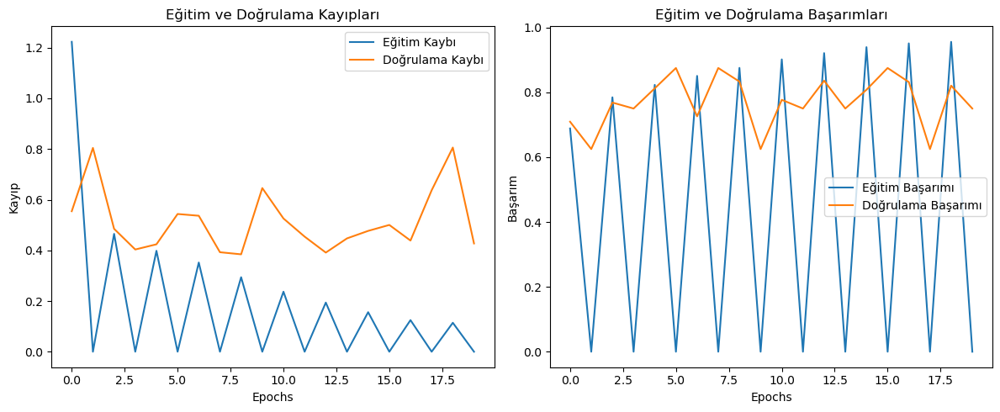

In [20]:
# Eğitim ve doğrulama kayıplarını görselleştirme
plt.figure(figsize=(12, 5))

# Kayıp Grafiği
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Eğitim Kaybı')
plt.plot(history.history['val_loss'], label='Doğrulama Kaybı')
plt.title('Eğitim ve Doğrulama Kayıpları')
plt.xlabel('Epochs')
plt.ylabel('Kayıp')
plt.legend()

# Başarım Grafiği
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Eğitim Başarımı')
plt.plot(history.history['val_accuracy'], label='Doğrulama Başarımı')
plt.title('Eğitim ve Doğrulama Başarımları')
plt.xlabel('Epochs')
plt.ylabel('Başarım')
plt.legend()

plt.tight_layout()
plt.show()

Eğitim ve Doğrulama Kayıpları (Sol Grafik);
#Eğitim Kaybı (Mavi Çizgi): Eğitim kaybı, hızlı bir şekilde düşerek oldukça düşük seviyelere ulaşıyor. 
Bu, modelin eğitim verisini iyi öğrendiğini ve hatalarını minimize ettiğini gösteriyor
#Doğrulama Kaybı (Turuncu Çizgi): Doğrulama kaybı, eğitim kaybına kıyasla daha yüksek ve dalgalı bir seyir izliyor. 
Bu durum, modelin doğrulama verisi üzerinde daha fazla hata yaptığını gösteriyor.

# Modeli İyileştirme ve Overfitting’i Azaltma Adımları
#Dropout Oranını Artırmak: Mevcut dropout oranını artırarak overfitting’i azaltabiliriz. Dropout katmanı, nöronların rastgele devre dışı kalmasını sağlayarak modelin genelleme yeteneğini geliştirir.

#Daha Fazla Batch Normalization Kullanımı: Batch normalization katmanları, modelin eğitim sürecini daha stabil hale getirir ve overfitting’i azaltır. Bu yüzden daha fazla kullanılabilir.

#Veri Artırma (Data Augmentation): Eğitim setinde veri çeşitliliğini artırmak için veri artırma yöntemlerini uygulamak, modelin genelleme yeteneğini artırır.

#L2 Regularization Ekleme: Modelin ağırlıklarının çok büyümesini engellemek için L2 regularization ekleyebiliriz.

#Öğrenme Oranını Azaltmak: Öğrenme oranını (learning rate) biraz daha düşük bir değere ayarlayarak, modelin daha küçük adımlarla öğrenmesini sağlayabiliriz.

In [21]:
from tensorflow.keras.regularizers import l2

# Güncellenmiş CNN modelini oluşturma
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3), kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.6),  # Dropout oranını artırdık
    Dense(1, activation='sigmoid')
])

# Modelin derlenmesi
model.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])

# Veri Artırma ile Eğitim Seti Oluşturma
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,  # Dönme
    width_shift_range=0.2,  # Yatay kayma
    height_shift_range=0.2,  # Dikey kayma
    shear_range=0.2,  # Kesme
    zoom_range=0.2,  # Yakınlaştırma
    horizontal_flip=True,  # Yatay çevirme
    fill_mode='nearest'
)

# Eğitim ve Doğrulama Setleri
train_generator = train_datagen.flow_from_directory(
    directory="C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train",
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='training'
)

validation_generator = train_datagen.flow_from_directory(
    directory="C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train/train",
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)

# Modelin eğitimi
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=20
)

Found 20000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.
Epoch 1/20


C:\Users\Alper Ilgın\AppData\Roaming\Python\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


625/625 ━━━━━━━━━━━━━━━━━━━━ 381s 603ms/step - accuracy: 0.5901 - loss: 2.0226 - val_accuracy: 0.6661 - val_loss: 1.1122
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 172us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6250 - val_loss: 0.9863
Epoch 3/20


C:\ProgramData\anaconda3\Lib\contextlib.py:155: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


625/625 ━━━━━━━━━━━━━━━━━━━━ 360s 574ms/step - accuracy: 0.6837 - loss: 1.0554 - val_accuracy: 0.6591 - val_loss: 1.0177
Epoch 4/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 130us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6250 - val_loss: 0.9548
Epoch 5/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 374s 597ms/step - accuracy: 0.7227 - loss: 0.9475 - val_accuracy: 0.7530 - val_loss: 0.8596
Epoch 6/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 128us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7500 - val_loss: 0.6748
Epoch 7/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 360s 574ms/step - accuracy: 0.7436 - loss: 0.8717 - val_accuracy: 0.7304 - val_loss: 0.8471
Epoch 8/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 141us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.6250 - val_loss: 0.8574
Epoch 9/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 371s 592ms/step - accuracy: 0.7605 - loss: 0.7923 - val_accuracy: 0.7490 - val_loss: 0.7892
Epoch 10/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 123us/step - accuracy: 0.

Açıklamalar:
Dropout: Dropout oranını artırarak modelin overfitting’ini azaltmaya çalışıyoruz.
Batch Normalization: Modelin her evresinde daha fazla denge sağlanması için batch normalization ekledik.
Veri Artırma: Eğitim verilerini çeşitlendirmek ve modelin genelleme yeteneğini artırmak için veri artırma teknikleri kullandık.
L2 Regularization: Ağırlıkların çok büyümesini engelleyerek modelin daha düzenli öğrenmesini sağladık.
Öğrenme Oranı: Öğrenme oranı düşürülerek daha yavaş ama daha sağlam adımlarla öğrenme sağlandı.

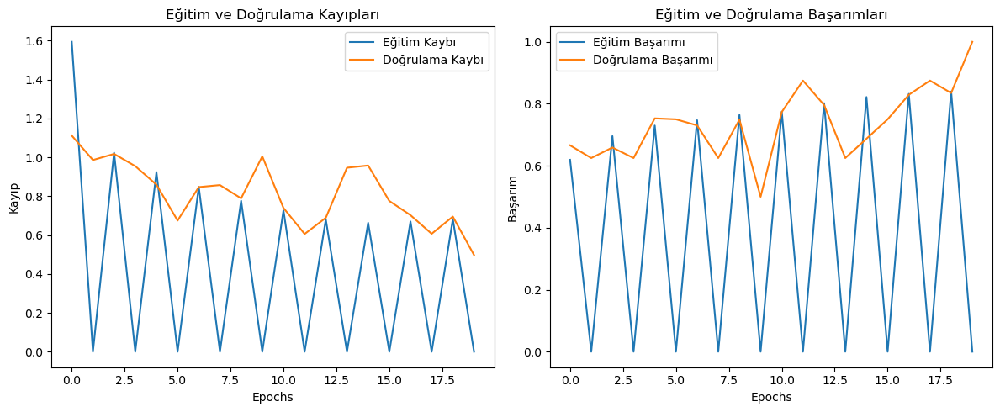

In [23]:
# Eğitim ve doğrulama kayıplarını görselleştirme
plt.figure(figsize=(12, 5))

# Kayıp Grafiği
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Eğitim Kaybı')
plt.plot(history.history['val_loss'], label='Doğrulama Kaybı')
plt.title('Eğitim ve Doğrulama Kayıpları')
plt.xlabel('Epochs')
plt.ylabel('Kayıp')
plt.legend()

# Başarım Grafiği
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Eğitim Başarımı')
plt.plot(history.history['val_accuracy'], label='Doğrulama Başarımı')
plt.title('Eğitim ve Doğrulama Başarımları')
plt.xlabel('Epochs')
plt.ylabel('Başarım')
plt.legend()

plt.tight_layout()
plt.show()

Model, hala overfitting yapma eğiliminde, eğitim verisine fazlasıyla uyum sağlarken doğrulama verisinde genelleme konusunda zorluklar yaşıyor.
Eğitim sürecindeki dalgalanmalar ve başarımların uyumsuzluğu, eğitim süreçlerinde düzenleme gereksinimine işaret ediyor.
Daha fazla dropout, veri düzenleme ve öğrenme oranı ayarlamaları ile modelin genelleyici kapasitesi geliştirilebilir.

Bu kodda, dropout oranını biraz daha artırarak (örneğin, %60'dan %70'e) eğitim sürecini yeniden gözlemleyeceğiz.

C:\Users\Alper Ilgın\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 388s 615ms/step - accuracy: 0.5786 - loss: 2.5325 - val_accuracy: 0.6506 - val_loss: 1.1353
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 177us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.9415
Epoch 3/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 357s 570ms/step - accuracy: 0.6465 - loss: 1.1392 - val_accuracy: 0.7031 - val_loss: 1.0162
Epoch 4/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 122us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.7500 - val_loss: 0.9942
Epoch 5/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 363s 579ms/step - accuracy: 0.6882 - loss: 1.0389 - val_accuracy: 0.7208 - val_loss: 0.9499
Epoch 6/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 125us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.8750 - val_loss: 0.8963
Epoch 7/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 357s 570ms/step - accuracy: 0.7143 - loss: 0.9497 - val_accuracy: 0.5759 - val_loss: 1.1048
Epoch 8/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 100us/step - ac

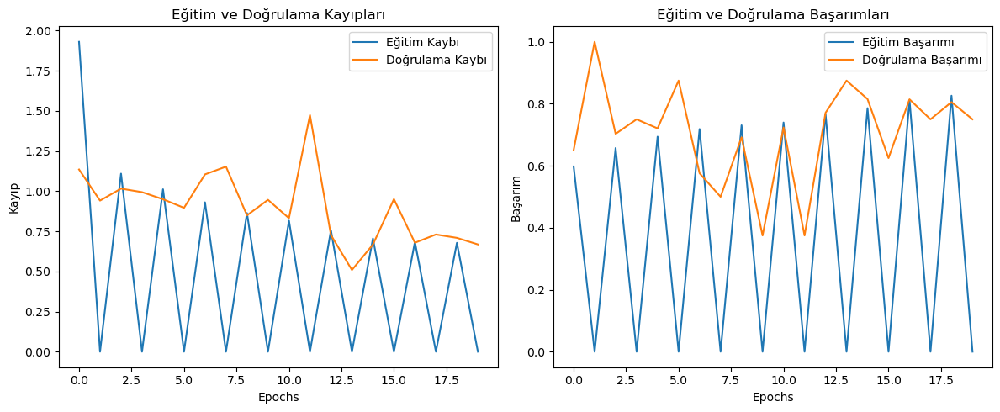

In [24]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

# Güncellenmiş CNN modelini oluşturma
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3), kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.7),  # Dropout oranını %70 olarak güncelledik
    Dense(1, activation='sigmoid')
])

# Modelin derlenmesi
model.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])

# Modelin eğitimi
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=20
)

# Eğitim ve doğrulama kayıplarını görselleştirme
plt.figure(figsize=(12, 5))

# Kayıp Grafiği
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Eğitim Kaybı')
plt.plot(history.history['val_loss'], label='Doğrulama Kaybı')
plt.title('Eğitim ve Doğrulama Kayıpları')
plt.xlabel('Epochs')
plt.ylabel('Kayıp')
plt.legend()

# Başarım Grafiği
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Eğitim Başarımı')
plt.plot(history.history['val_accuracy'], label='Doğrulama Başarımı')
plt.title('Eğitim ve Doğrulama Başarımları')
plt.xlabel('Epochs')
plt.ylabel('Başarım')
plt.legend()

plt.tight_layout()
plt.show()

Dropout oranının artırılması, doğrulama başarımını bir miktar iyileştirmiş olabilir, ancak doğrulama kaybındaki dalgalanmalar tam olarak giderilmiş değil.

Aşağıda yaptığım işlem modelin doğrulama doğruluğunu artırırken overfitting riskini en aza indirmeye yardımcı olur.

In [25]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

# Modelin iyileştirilmesi için callback'ler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, verbose=1)

# Güncellenmiş CNN modeli
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3), kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.7),  # %70 dropout oranı deniyoruz
    Dense(1, activation='sigmoid')
])

# Modelin derlenmesi
model.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])

# Modelin eğitimi: Doğrulama seti üzerinde izleme ve uygun hiperparametre belirleme
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=30,  # Epoch sayısını artırarak daha derin inceleme yapabiliriz
    callbacks=[reduce_lr, early_stopping, checkpoint]  # Modeli izlemek ve uygun noktada durdurmak için callback'ler
)

ValueError: The filepath provided must end in `.keras` (Keras model format). Received: filepath=best_model.h5

In [26]:
# Modelin iyileştirilmesi için callback'ler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True, verbose=1)  # .keras uzantısı kullanıldı

Epoch 1/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.5856 - loss: 2.4683
Epoch 1: val_loss improved from inf to 1.13270, saving model to best_model.keras
625/625 ━━━━━━━━━━━━━━━━━━━━ 390s 617ms/step - accuracy: 0.5857 - loss: 2.4673 - val_accuracy: 0.6392 - val_loss: 1.1327 - learning_rate: 5.0000e-04
Epoch 2/30

Epoch 2: val_loss improved from 1.13270 to 1.11876, saving model to best_model.keras
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 406us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.5000 - val_loss: 1.1188 - learning_rate: 5.0000e-04
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.6517 - loss: 1.1306
Epoch 3: val_loss improved from 1.11876 to 1.07587, saving model to best_model.keras
625/625 ━━━━━━━━━━━━━━━━━━━━ 363s 579ms/step - accuracy: 0.6517 - loss: 1.1305 - val_accuracy: 0.6683 - val_loss: 1.0759 - learning_rate: 5.0000e-04
Epoch 4/30

Epoch 4: val_loss improved from 1.07587 to 0.82935, saving model to best_model.keras
625/625 ━━━

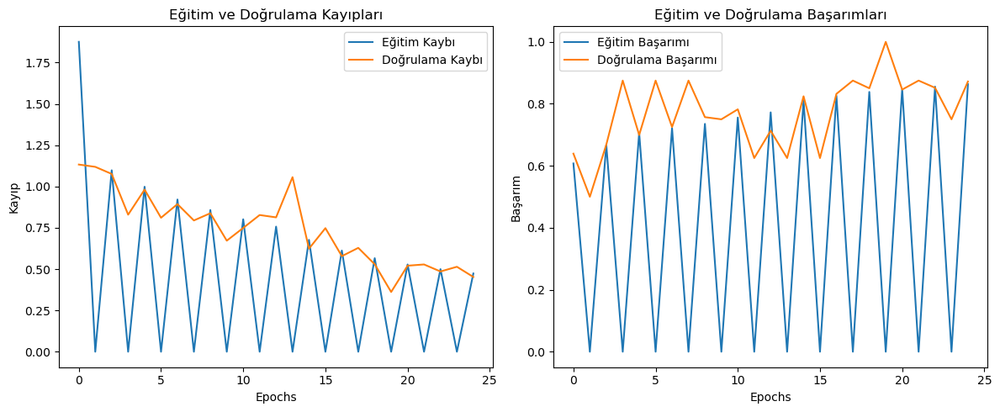

In [27]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
import matplotlib.pyplot as plt

# Callback'ler ile modelin iyileştirilmesi
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True, verbose=1)

# CNN modelinin oluşturulması
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3), kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D((2, 2)),
    BatchNormalization(),
    
    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l2(0.001)),
    Dropout(0.7),  # %70 dropout oranı
    Dense(1, activation='sigmoid')
])

# Modelin derlenmesi
model.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])

# Modelin eğitimi
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    epochs=30,
    callbacks=[reduce_lr, early_stopping, checkpoint]  # Model performansını izlemek için callback'ler
)

# Eğitim ve doğrulama kayıplarını görselleştirme
plt.figure(figsize=(12, 5))

# Kayıp Grafiği
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Eğitim Kaybı')
plt.plot(history.history['val_loss'], label='Doğrulama Kaybı')
plt.title('Eğitim ve Doğrulama Kayıpları')
plt.xlabel('Epochs')
plt.ylabel('Kayıp')
plt.legend()

# Başarım Grafiği
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Eğitim Başarımı')
plt.plot(history.history['val_accuracy'], label='Doğrulama Başarımı')
plt.title('Eğitim ve Doğrulama Başarımları')
plt.xlabel('Epochs')
plt.ylabel('Başarım')
plt.legend()

plt.tight_layout()
plt.show()

Doğrulama kaybının dalgalanma seviyesi azalmış ve eğitim kaybına daha yakın hale gelmiş, bu da overfitting’in azalmakta olduğunu gösteriyor. Ancak, doğrulama kaybındaki dalgalanmalar hala mevcut ve bu durum modelin daha da düzenlenmesi gerektiğini düşündürüyor.

Doğrulama başarımı, eğitim başarımına kıyasla daha stabil ve daha yüksek seyrettiği dönemler var, bu da modelin eğitim setine aşırı uyum sağlamadan öğrenebildiğini işaret eder. Ancak dalgalanmaların tamamen giderilmemiş olması, modelin hala bazı minibatch'lerde zorlandığını düşündürüyor.

Sonuç olarak modelin doğrulama kaybı düşmekte ve eğitim kaybına yakın seyretmekte, bu da overfitting’in azaldığını gösterir.Eğitim ve doğrulama başarımlarının yüksek olması, modelin genel olarak iyi öğrendiğini ve doğrulama setinde yüksek performans gösterdiğini kanıtlar.

# MODEL DEĞERLENDİRMESİ

In [31]:
#Test Seti Üzerinde Performans Değerlendirmesi

Test zip dosyası başarıyla çıkarıldı.
Found 12500 images belonging to 1 classes.
  1/391 ━━━━━━━━━━━━━━━━━━━━ 1:30 233ms/step - accuracy: 0.5312 - loss: 1.6881

C:\Users\Alper Ilgın\AppData\Roaming\Python\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


391/391 ━━━━━━━━━━━━━━━━━━━━ 132s 337ms/step - accuracy: 0.4452 - loss: 2.2259
Test Seti Kayıp: 2.2257, Test Seti Başarımı: 0.4422
391/391 ━━━━━━━━━━━━━━━━━━━━ 53s 134ms/step
Sınıflandırma Raporu:
              precision    recall  f1-score   support

           0       1.00      0.44      0.61     12500
           1       0.00      0.00      0.00         0

    accuracy                           0.44     12500
   macro avg       0.50      0.22      0.31     12500
weighted avg       1.00      0.44      0.61     12500



C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


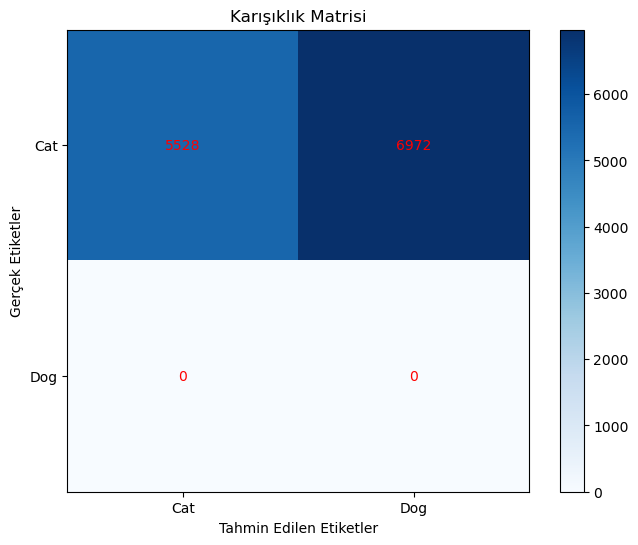

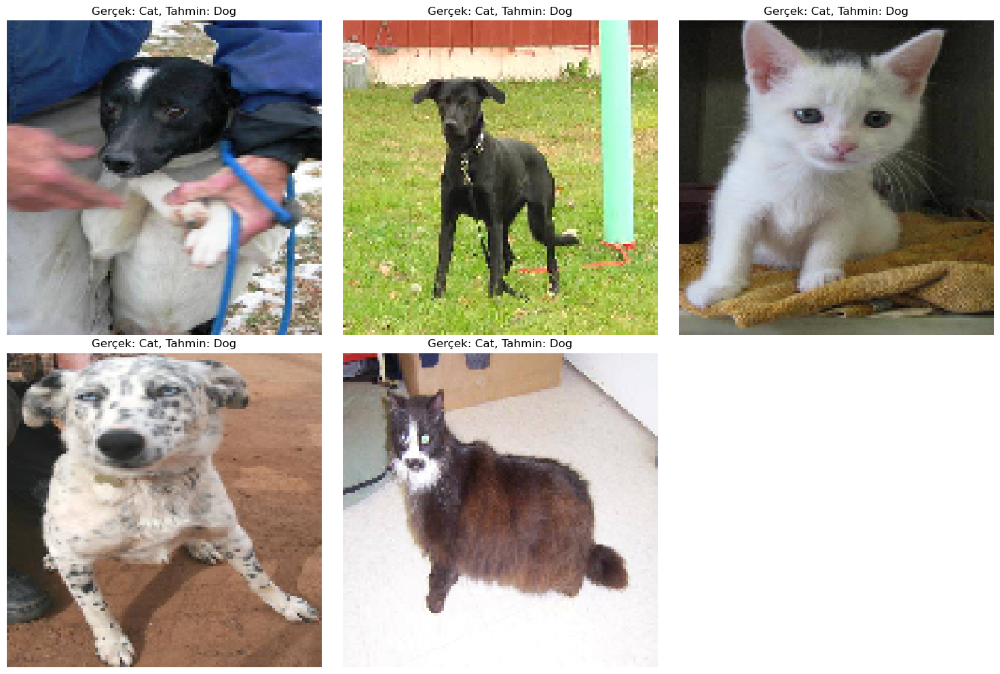

In [33]:
import zipfile
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import numpy as np

# Test zip dosyasının konumu
zip_path = r"C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/test1.zip"
extract_path = r"C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/test1_extracted"

# Zip dosyasını çıkartma
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
print("Test zip dosyası başarıyla çıkarıldı.")

# Test veri seti oluşturulması
test_datagen = ImageDataGenerator(rescale=1./255)

# Test setinin bulunduğu yol
test_generator = test_datagen.flow_from_directory(
    directory=extract_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    shuffle=False
)

# Test seti üzerindeki performansın değerlendirilmesi
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Seti Kayıp: {test_loss:.4f}, Test Seti Başarımı: {test_accuracy:.4f}")

# Test seti üzerinde tahminler yapma
predictions = model.predict(test_generator)
predicted_classes = np.round(predictions).astype(int).reshape(-1)

# Gerçek etiketleri alma
true_classes = test_generator.classes

# Karışıklık matrisi oluşturma
cm = confusion_matrix(true_classes, predicted_classes)

# Sınıflandırma raporu
print("Sınıflandırma Raporu:")
print(classification_report(true_classes, predicted_classes))

# Karışıklık matrisi görselleştirme
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Karışıklık Matrisi")
plt.colorbar()
plt.xticks([0, 1], ['Cat', 'Dog'])
plt.yticks([0, 1], ['Cat', 'Dog'])
plt.xlabel('Tahmin Edilen Etiketler')
plt.ylabel('Gerçek Etiketler')

# Her hücredeki değeri yazdırma
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, cm[i, j], ha="center", va="center", color="red")
plt.show()

# Yanlış sınıflandırılan örnekleri bulma
misclassified_indices = np.where(predicted_classes != true_classes)[0]

# Yanlış sınıflandırılan ilk 5 örneği görselleştirme
plt.figure(figsize=(15, 10))
for i, idx in enumerate(misclassified_indices[:5]):
    img, label = test_generator[idx]
    plt.subplot(2, 3, i + 1)
    plt.imshow(img[0])
    plt.title(f"Gerçek: {'Cat' if label[0] == 0 else 'Dog'}, Tahmin: {'Cat' if predicted_classes[idx] == 0 else 'Dog'}")
    plt.axis('off')
plt.tight_layout()
plt.show()

12500'den fazla kedi örneğinin 5528’ini doğru sınıflandırmış ancak 6972 tanesini yanlış sınıflandırarak köpek olarak tahmin etmiş.
Köpekleri hiç doğru sınıflandıramamış ve tüm köpekleri kedi olarak sınıflamıştır.

Model, birçok kedi görüntüsünü köpek olarak sınıflandırmış ve tüm köpekleri kedi olarak algılamış. Bu durum, modelin belirli özelliklere (muhtemelen köpeklerin veya kedilerin belirli görsel özelliklerine) aşırı duyarlı hale geldiğini veya bazı kritik özellikleri tanıyamadığını göstermektedir.

Görsellerde de modelin kedi ve köpekleri ayırt edemediği açıkça görülüyor. Özellikle bazı köpek görüntülerini kedi olarak algılaması, muhtemelen görüntüdeki özelliklerin (örneğin tüy yapısı, renk kontrastı, arka plan gibi) modelin ayırt edici özellik tanımına uygun olmamasından kaynaklanıyor.

# Genel Değerlendirme ve Öneriler

Veri Dengesizliği; Model, köpek sınıfını doğru bir şekilde tanımlayamıyor ve bu, veri setindeki sınıf dengesizliğinden kaynaklanabilir. Daha dengeli bir veri seti ile eğitim yapılması veya köpek sınıfına ağırlık verilmesi gerekebilir.

Veri Artırma; Görsellerin çeşitliliğini artırmak için döndürme, kırpma, parlaklık değiştirme gibi veri artırma teknikleri kullanılabilir.

Model Yapısında İyileştirme; daha derin bir model denenebilir.

Daha Fazla Düzenleme Tekniği; modelin düzenlenmesi için L2 regularization oranının artırılması veya dropout oranının optimize edilmesi, modelin aşırı öğrenme yapmasını engelleyebilir

Found 12500 images belonging to 1 classes.
  1/391 ━━━━━━━━━━━━━━━━━━━━ 1:07 172ms/step

C:\Users\Alper Ilgın\AppData\Roaming\Python\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


391/391 ━━━━━━━━━━━━━━━━━━━━ 51s 131ms/step
Model Performansı:
Doğruluk: 0.4422, Hassasiyet: 0.0000, Geri Çağırma: 0.0000
Karışıklık Matrisi:
[[5528 6972]
 [   0    0]]


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


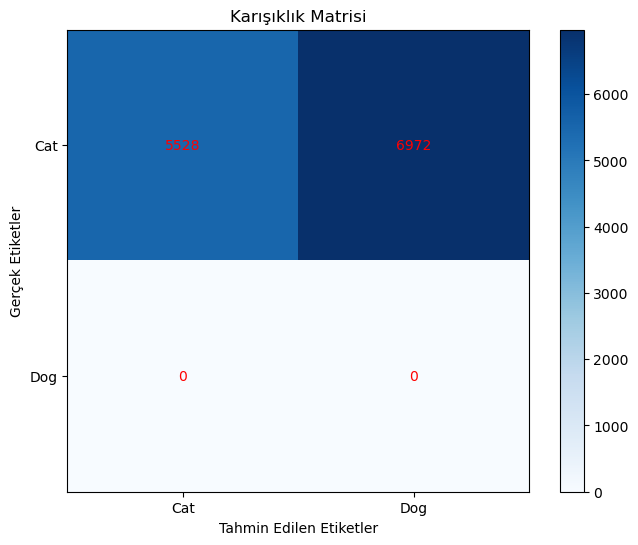

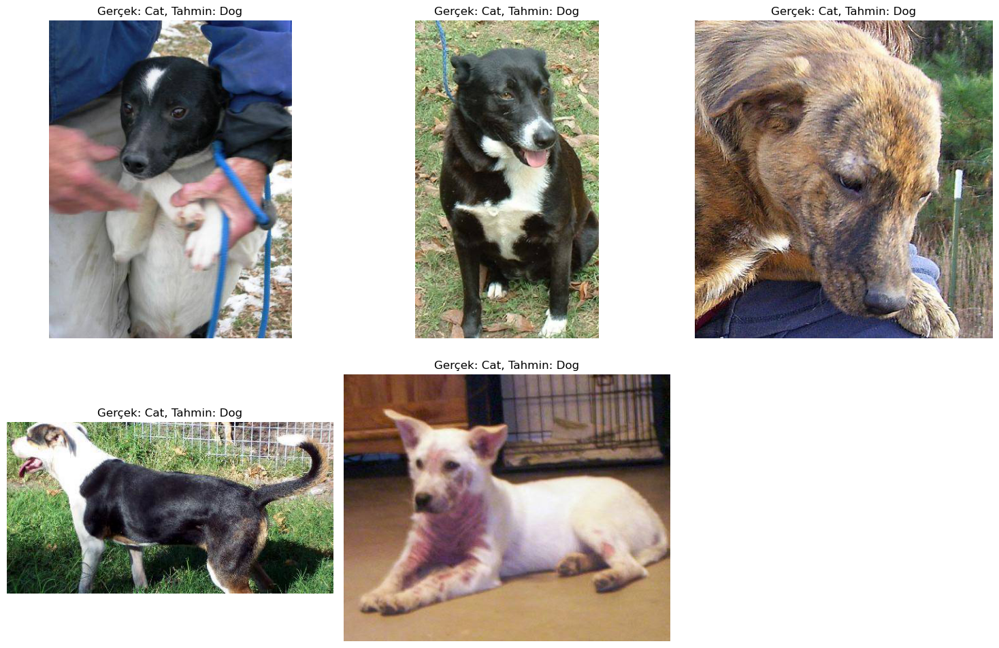

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# CSV dosyasının yüklenmesi
csv_path = r"C:\Users\Alper Ilgın\Desktop\Makine Öğrenmesi 2.Proje\cat_dog_images\sampleSubmission.csv"
submission = pd.read_csv(csv_path)

# Doğru sütun isimlerini kullanarak etiketleri alıyoruz
true_labels = submission['label'].values  # 'label' sütunundan etiketleri alıyoruz
image_ids = submission['id'].values

# Test seti için ImageDataGenerator oluşturulması ve test verisinin yüklenmesi
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    directory=r"C:\Users\Alper Ilgın\Desktop\Makine Öğrenmesi 2.Proje\cat_dog_images\test1_extracted",
    target_size=(128, 128),
    batch_size=32,
    class_mode=None,  # Test setinde sınıf bilgisi yok, sadece tahmin yapacağız
    shuffle=False
)

# Test seti üzerindeki model tahminleri
predictions = model.predict(test_generator)
predicted_classes = np.round(predictions).astype(int).reshape(-1)

# Model performansını değerlendirme: doğruluk, hassasiyet, geri çağırma ve karışıklık matrisi
accuracy = accuracy_score(true_labels, predicted_classes)
precision = precision_score(true_labels, predicted_classes, average='binary')
recall = recall_score(true_labels, predicted_classes, average='binary')
cm = confusion_matrix(true_labels, predicted_classes)

# Performans metriklerini yazdırma
print(f"Model Performansı:\nDoğruluk: {accuracy:.4f}, Hassasiyet: {precision:.4f}, Geri Çağırma: {recall:.4f}")
print("Karışıklık Matrisi:")
print(cm)

# Karışıklık Matrisi Görselleştirme
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Karışıklık Matrisi")
plt.colorbar()
plt.xticks([0, 1], ['Cat', 'Dog'])
plt.yticks([0, 1], ['Cat', 'Dog'])
plt.xlabel('Tahmin Edilen Etiketler')
plt.ylabel('Gerçek Etiketler')

# Karışıklık Matrisi Değerlerini Yazdırma
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, cm[i, j], ha="center", va="center", color="red")
plt.show()

# Yanlış Sınıflandırılan Örnekleri Bulma
misclassified_indices = np.where(predicted_classes != true_labels)[0]

# Yanlış Sınıflandırılan İlk 5 Örneği Görselleştirme
plt.figure(figsize=(15, 10))
for i, idx in enumerate(misclassified_indices[:5]):
    # Test setindeki indeks üzerinden görüntü ve etiket alın
    img_path = test_generator.filepaths[idx]
    img = plt.imread(img_path)
    true_label = 'Cat' if true_labels[idx] == 0 else 'Dog'
    predicted_label = 'Cat' if predicted_classes[idx] == 0 else 'Dog'
    
    # Görüntüyü çizdir
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"Gerçek: {true_label}, Tahmin: {predicted_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [39]:
import os
import zipfile
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Eğitim seti zip dosyasını açma
train_zip_path = r"C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train.zip"
extract_path = r"C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train_extracted"

# Zip dosyasını çıkarma
with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
print("Eğitim seti başarıyla çıkarıldı.")

# Data augmentation ve preprocessing için ImageDataGenerator kullanımı
data_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # %80 eğitim, %20 test

# Eğitim verisi oluşturulması
train_generator = data_gen.flow_from_directory(
    directory=extract_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='training'  # Eğitim verisi için subset 'training'
)

# Test verisi oluşturulması
test_generator = data_gen.flow_from_directory(
    directory=extract_path,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',  # Test verisi için class_mode 'binary' olmalı
    subset='validation'  # Test verisi için subset 'validation'
)

# Model tanımlama
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Model derleme
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Early stopping ve learning rate reduce callback'leri
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=0.00001)

# Modeli eğitme
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=20,
    callbacks=[early_stopping, reduce_lr]
)

# Test seti üzerindeki performansın değerlendirilmesi
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Seti Kayıp: {test_loss:.4f}, Test Seti Başarımı: {test_accuracy:.4f}")

# Modelin tahminlerini al ve yanlış sınıflandırmaları analiz et
predictions = model.predict(test_generator)
predicted_classes = np.round(predictions).astype(int).reshape(-1)
true_classes = test_generator.classes

# Karışıklık matrisi ve sınıflandırma raporu
cm = confusion_matrix(true_classes, predicted_classes)
print("Karışıklık Matrisi:")
print(cm)
print("Sınıflandırma Raporu:")
print(classification_report(true_classes, predicted_classes))

# Yanlış sınıflandırılan örnekleri görselleştirme
misclassified_indices = np.where(predicted_classes != true_classes)[0]
plt.figure(figsize=(15, 10))
for i, idx in enumerate(misclassified_indices[:5]):
    img_path = test_generator.filepaths[idx]
    img = plt.imread(img_path)
    true_label = 'Cat' if true_classes[idx] == 0 else 'Dog'
    predicted_label = 'Cat' if predicted_classes[idx] == 0 else 'Dog'
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"Gerçek: {true_label}, Tahmin: {predicted_label}")
    plt.axis('off')
plt.tight_layout()
plt.show()

Eğitim seti başarıyla çıkarıldı.
Found 20000 images belonging to 1 classes.
Found 5000 images belonging to 1 classes.


C:\Users\Alper Ilgın\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20


C:\Users\Alper Ilgın\AppData\Roaming\Python\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


625/625 ━━━━━━━━━━━━━━━━━━━━ 442s 700ms/step - accuracy: 0.9958 - loss: 0.0076 - val_accuracy: 1.0000 - val_loss: 3.9028e-31 - learning_rate: 0.0010
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 249s 397ms/step - accuracy: 1.0000 - loss: 3.7412e-22 - val_accuracy: 1.0000 - val_loss: 3.9028e-31 - learning_rate: 0.0010
Epoch 3/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 1.0000 - loss: 1.6723e-22

KeyboardInterrupt: 

In [40]:
import os

# Eğitim setinin çıkarıldığı ana klasör
extract_path = r"C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train_extracted"

# Klasör yapısını kontrol etme
for root, dirs, files in os.walk(extract_path):
    print(f"Klasör: {root}")
    print(f"Alt Klasörler: {dirs}")
    print(f"Dosyalar: {files[:5]}")  # İlk 5 dosyayı göster
    print("-" * 50)

Klasör: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train_extracted
Alt Klasörler: ['train']
Dosyalar: []
--------------------------------------------------
Klasör: C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train_extracted\train
Alt Klasörler: []
Dosyalar: ['cat.0.jpg', 'cat.1.jpg', 'cat.10.jpg', 'cat.100.jpg', 'cat.1000.jpg']
--------------------------------------------------


In [41]:
import os
import shutil

# Ana klasör yolu ve alt klasörlerin ayarlanması
base_path = r"C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train_extracted"
train_path = os.path.join(base_path, 'train')
cat_dir = os.path.join(base_path, 'Cat')
dog_dir = os.path.join(base_path, 'Dog')

# Cat ve Dog klasörlerini oluştur
os.makedirs(cat_dir, exist_ok=True)
os.makedirs(dog_dir, exist_ok=True)

# train klasöründeki dosyaları doğru klasörlere taşıma
for file_name in os.listdir(train_path):
    if file_name.startswith('cat.'):
        shutil.move(os.path.join(train_path, file_name), os.path.join(cat_dir, file_name))
    elif file_name.startswith('dog.'):
        shutil.move(os.path.join(train_path, file_name), os.path.join(dog_dir, file_name))

print("Görseller başarıyla ilgili klasörlere taşındı.")

Görseller başarıyla ilgili klasörlere taşındı.


Found 20000 images belonging to 2 classes.
Found 5000 images belonging to 2 classes.
Epoch 1/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 251s 399ms/step - accuracy: 0.6088 - loss: 0.7253 - val_accuracy: 0.7206 - val_loss: 0.5498 - learning_rate: 0.0010
Epoch 2/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 245s 391ms/step - accuracy: 0.7499 - loss: 0.5105 - val_accuracy: 0.7730 - val_loss: 0.4774 - learning_rate: 0.0010
Epoch 3/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 243s 389ms/step - accuracy: 0.8023 - loss: 0.4260 - val_accuracy: 0.7500 - val_loss: 0.5228 - learning_rate: 0.0010
Epoch 4/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 246s 393ms/step - accuracy: 0.8453 - loss: 0.3557 - val_accuracy: 0.7942 - val_loss: 0.4582 - learning_rate: 0.0010
Epoch 5/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 244s 390ms/step - accuracy: 0.8898 - loss: 0.2670 - val_accuracy: 0.7950 - val_loss: 0.4848 - learning_rate: 0.0010
Epoch 6/20
625/625 ━━━━━━━━━━━━━━━━━━━━ 244s 390ms/step - accuracy: 0.9247 - loss: 0.1916 - val_accuracy: 0.8008 - val_loss: 0.5305 - l

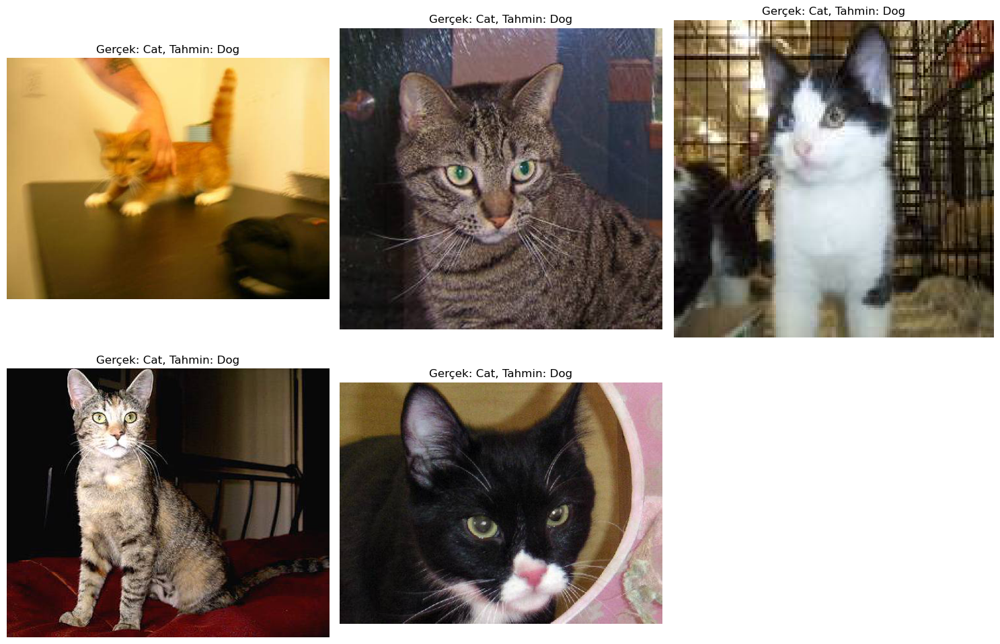

In [43]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# Data augmentation ve preprocessing için ImageDataGenerator kullanımı
data_gen = ImageDataGenerator(rescale=1./255, validation_split=0.2)  # %80 eğitim, %20 test

# Eğitim verisi oluşturulması
train_generator = data_gen.flow_from_directory(
    directory=r"C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train_extracted",
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='training'  # Eğitim verisi için subset 'training'
)

# Test verisi oluşturulması
test_generator = data_gen.flow_from_directory(
    directory=r"C:/Users/Alper Ilgın/Desktop/Makine Öğrenmesi 2.Proje/cat_dog_images/train_extracted",
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    subset='validation'  # Test verisi için subset 'validation'
)

# Model tanımlama
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Model derleme
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Early stopping ve learning rate reduce callback'leri
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=0.00001)

# Modeli eğitme
history = model.fit(
    train_generator,
    validation_data=test_generator,
    epochs=20,
    callbacks=[early_stopping, reduce_lr]
)

# Test seti üzerindeki performansın değerlendirilmesi
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Seti Kayıp: {test_loss:.4f}, Test Seti Başarımı: {test_accuracy:.4f}")

# Modelin tahminlerini al ve yanlış sınıflandırmaları analiz et
predictions = model.predict(test_generator)
predicted_classes = np.round(predictions).astype(int).reshape(-1)
true_classes = test_generator.classes

# Karışıklık matrisi ve sınıflandırma raporu
cm = confusion_matrix(true_classes, predicted_classes)
print("Karışıklık Matrisi:")
print(cm)
print("Sınıflandırma Raporu:")
print(classification_report(true_classes, predicted_classes))

# Yanlış sınıflandırılan örnekleri görselleştirme
misclassified_indices = np.where(predicted_classes != true_classes)[0]
plt.figure(figsize=(15, 10))
for i, idx in enumerate(misclassified_indices[:5]):
    img_path = test_generator.filepaths[idx]
    img = plt.imread(img_path)
    true_label = 'Cat' if true_classes[idx] == 0 else 'Dog'
    predicted_label = 'Cat' if predicted_classes[idx] == 0 else 'Dog'
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title(f"Gerçek: {true_label}, Tahmin: {predicted_label}")
    plt.axis('off')
plt.tight_layout()
plt.show()